# **"License Plate Extraction Using YOLOv8 and PaddleOCR"**

### The purpose of this notebook is to test the license plate detection using YOLOv8 and extraction using PaddleOCR

#### **Libraries Used:**
>ultralytics

>EasyOCR

>PaddleOCR

#### **What is ultralytics library?**
>Ultralytics is a library for object detection, segmentation, and instance segmentation. It is used for image and video analysis.

#### **What is EasyOCR library?**
>EasyOCR is a library for optical character recognition. It is used to extract text from images.

#### **What is PaddleOCR library?**
>PaddleOCR is a library for optical character recognition. It is used to extract text from images. It's different from EasyOCR because it uses PaddlePaddle as its backend. PaddlePaddle is an open source deep learning framework which is better for image and video analysis.

#### **How to use?**

>1. Load YOLO weights

>2. Apply PaddleOCR to extract text and save them in DataFrame


# +_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+

## **Import Libraries**

In [2]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from ultralytics import YOLO
import shutil
import pandas as pd
from paddleocr import PaddleOCR
import easyocr
import random

## **Data Set**

In [ ]:
# Dataset link
# https://drive.google.com/drive/folders/1RR4fQLG4R7CMXqdXVisiJ65SLb19OyTW?usp=sharing

### Plot Images

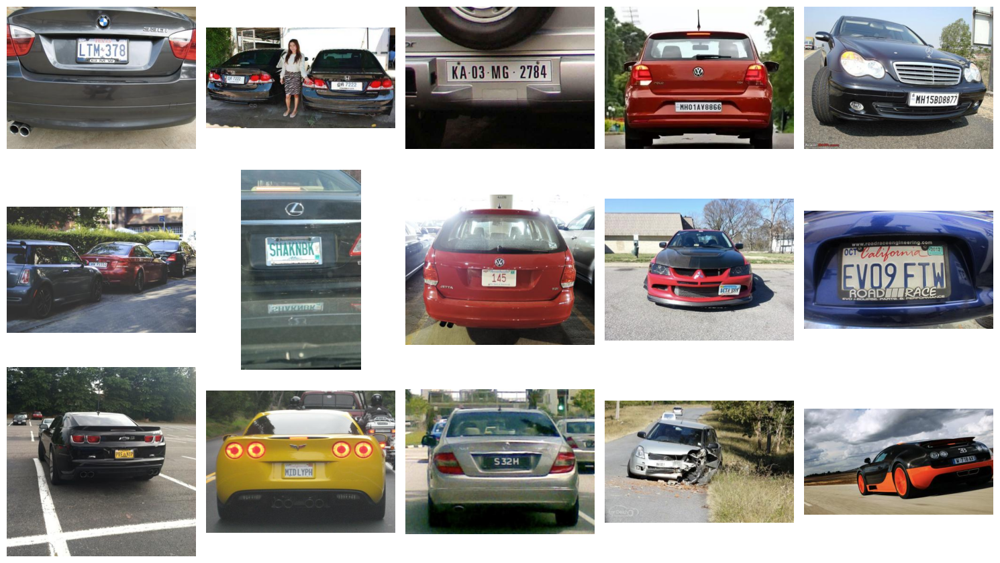

In [ ]:
# Define the path to the images folder
folder_path = 'X:/ML1/WEEK5/day2/data/test/images'

# Get a list of all image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('png', 'jpg', 'jpeg', 'bmp', 'gif'))]

# Check if there are at least 15 images
if len(image_files) < 15:
    raise ValueError("Not enough images in the folder. Please make sure there are at least 15 images.")

# Randomly select 15 image files
selected_files = random.sample(image_files, 15)

# Create a figure to plot the images
fig, axes = plt.subplots(3, 5, figsize=(15, 9))  # 3 rows, 5 columns

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each image
for ax, img_file in zip(axes, selected_files):
    img_path = os.path.join(folder_path, img_file)
    with Image.open(img_path) as img:
        ax.imshow(img)
        ax.axis('off')  # Hide axes

# Adjust layout and show plot
plt.tight_layout()
plt.show()

### DataSet Size

In [ ]:
import os

# List of folder paths and their corresponding labels
folders = {
    'Train': 'X:/ML1/WEEK5/day2/data/train/images',
    'Test': 'X:/ML1/WEEK5/day2/data/test/images',
    'Valid': 'X:/ML1/WEEK5/day2/data/valid/images'
}

# Iterate over each folder path and label
for label, folder_path in folders.items():
    # List all image files in the folder
    image_files = [filename for filename in os.listdir(folder_path) if filename.lower().endswith(('.jpg', '.png', '.jpeg', '.webp', '.JPG'))]

    # Count the number of images
    num_images = len(image_files)

    # Print the number of images with a friendly label
    print(f"Number of images in {label}: {num_images}")

Number of images in Train: 210
Number of images in Test: 30
Number of images in Valid: 60


# **Training the Detection Model**

### Mounting Google Drive to access data

In [2]:
from google.colab import drive

# Attempt to mount Google Drive with a longer timeout
drive.mount('/content/gdrive', force_remount=True, timeout_ms=120000)

Mounted at /content/gdrive


### Set route path to access data for training

In [3]:
ROOT_DIR = '/content/gdrive/My Drive/License_Plate_Detection'

### Install ultralytics to use YOLO

In [ ]:
!pip install ultralytics

### Train the model

In [ ]:
# Load a model
model = YOLO('yolov8n.pt')

# Use the model
results = model.train(data=os.path.join(ROOT_DIR, "data.yaml"), epochs=200, imgsz=640)

### Saving runs folder to Drive

In [ ]:
source_path = '/content/runs/'
destination_path = '/content/gdrive/MyDrive/License_Plate_Detection/runs_backup'
shutil.copytree(source_path, destination_path)

## **Model Statistics**

<img src="stats1.jpg" alt="Description"/>

### Confusion Matrix

<img src="confusion_matrix.png" alt="Description" width="750" height="550"/>

### Model Performance

<img src="results.png" alt="Description" width="900" height="400"/>

# **Testing the Model and Extracting License Plate**

### Load the best weights of trained YOLO

In [ ]:
model = YOLO("best.pt")

### Test model on image files


image 1/1 x:\ML1\WEEK5\day2\pk_l.png: 384x640 1 licence, 52.5ms
Speed: 2.0ms preprocess, 52.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


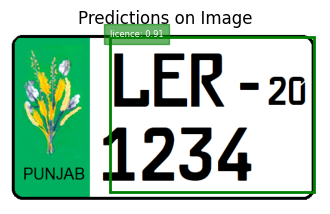

In [ ]:
# Load the image
image_path = 'pk_l.png'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

# Make predictions
results = model.predict(source=image_path)

# Plot the image with predictions
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(image)
ax.axis('off')  # Hide axes
ax.set_title('Predictions on Image')

# Plot the bounding boxes and labels
for result in results:
    boxes = result.boxes
    for box in boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='green', linewidth=2))
        label = f"{result.names[int(box.cls[0])]}: {box.conf[0]:.2f}"
        ax.text(x1, y1, label, fontsize=6, color='white', bbox=dict(facecolor='green', edgecolor='green', alpha=0.6))

plt.show()

## **Apply EasyOCR**

### Extract data and display it on bounding boxes

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.



image 1/1 X:\ML1\WEEK5\day2\Cars39_png.rf.fe511779e2f9eb9d412827d8d91f722b.jpg: 480x640 1 licence, 73.9ms
Speed: 1.9ms preprocess, 73.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 X:\ML1\WEEK5\day2\Cars54_png.rf.cb6867c72116a0b5e843d70cbe18c480.jpg: 480x640 1 licence, 68.0ms
Speed: 1.0ms preprocess, 68.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 X:\ML1\WEEK5\day2\Cars82_png.rf.90607df58f8987cc60238b328b92d75b.jpg: 256x640 1 licence, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 640)

image 1/1 X:\ML1\WEEK5\day2\pk_isl.png: 384x640 1 licence, 56.2ms
Speed: 2.0ms preprocess, 56.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 X:\ML1\WEEK5\day2\pk_l.png: 384x640 1 licence, 60.2ms
Speed: 1.0ms preprocess, 60.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


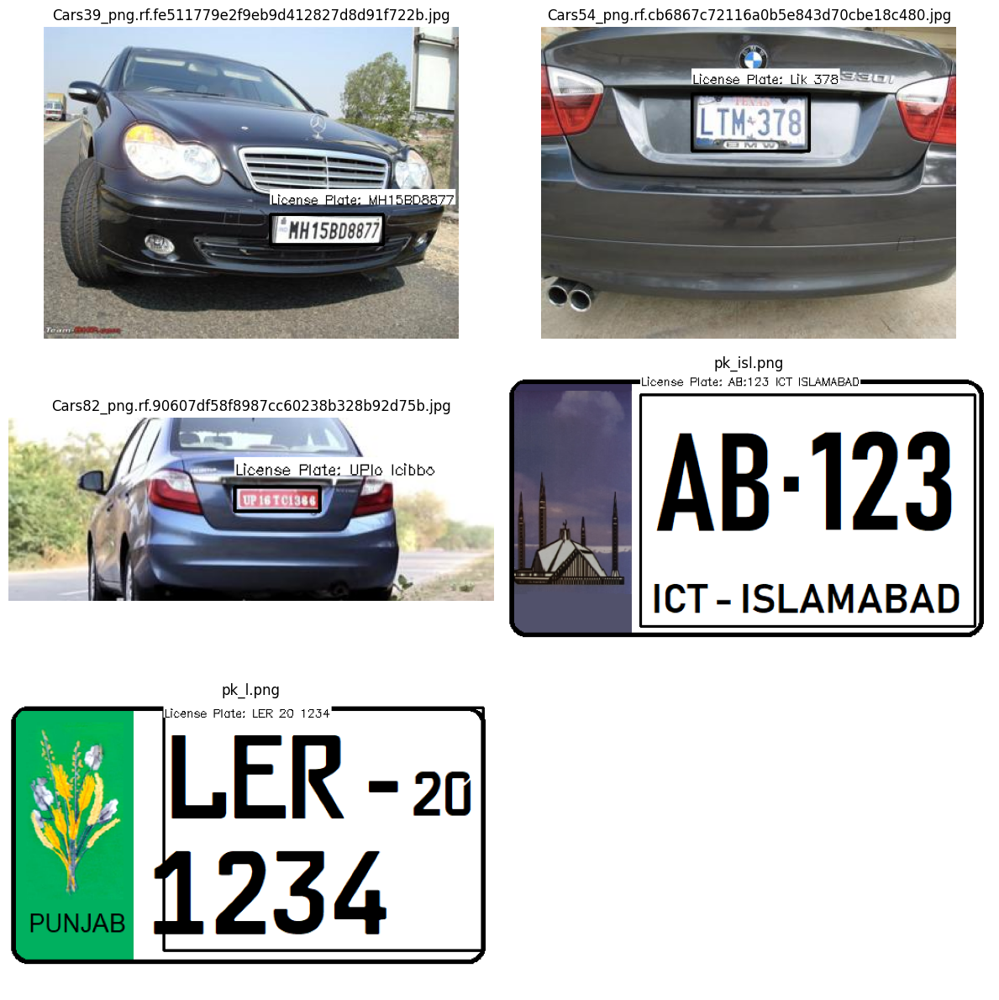

In [ ]:
# Initialize EasyOCR Reader
reader = easyocr.Reader(['en'])  # Specify the languages you want to use

# Set the folder path containing the images
folder_path = 'X:/ML1/WEEK5/day2/'

# Create a list to store the extracted license plate texts
extracted_texts = []

# Get the list of image files in the folder
image_files = [filename for filename in os.listdir(folder_path) if filename.endswith(('.jpg', '.png', '.jpeg', '.webp'))]
num_images = len(image_files)

# Create a figure with subplots
num_rows = (num_images + 1) // 2  # Calculate number of rows needed
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(12, 12))

# Iterate over the images in the folder
for i, filename in enumerate(image_files):
    # Load the image
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

    # Make predictions using the YOLOv8 model
    results = model.predict(source=image_path)

    # Initialize a list to hold the detected text lines
    text_lines = []

    # Process each detection
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates

            # Crop the license plate from the image
            license_plate = image_rgb[int(y1):int(y2), int(x1):int(x2)]

            # Apply OCR to the license plate image
            license_plate_text = reader.readtext(license_plate)

            # Extract the text and confidence from the OCR results
            if license_plate_text:
                for detection in license_plate_text:
                    # Each detection contains (bounding box, text, confidence)
                    bbox, text, confidence = detection
                    text_lines.append(text)  # Append the detected text line

    # Join all detected lines into a single string
    full_text = ' '.join(text_lines)

    # Store the extracted license plate text in the list
    extracted_texts.append((filename, full_text))

    # Draw the bounding box and license plate text on the image
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates
            cv2.rectangle(image_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 0), 2)
            y = int(y1) - 10 if int(y1) - 10 > 10 else int(y1) + 10

            # Add background to the text
            (text_width, text_height), _ = cv2.getTextSize(f'License Plate: {full_text}',
                                                           cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
            cv2.rectangle(image_rgb, (int(x1), y - text_height - 5), (int(x1 + text_width), y),
                          (255, 255, 255), -1)

            # Draw the text with the background
            cv2.putText(image_rgb, f'License Plate: {full_text}',
                        (int(x1), y), cv2.FONT_HERSHEY_SIMPLEX,
                        0.4, (0, 0, 0), 1)

    # Display the image with OCR results in the subplot
    row = i // 2
    col = i % 2
    axes[row, col].imshow(image_rgb)
    axes[row, col].axis('off')
    axes[row, col].set_title(filename)

# Hide any unused subplots
for j in range(i + 1, num_rows * 2):
    axes[j // 2, j % 2].axis('off')

# Save the figure
plt.tight_layout()
plt.savefig('license_plate_detection.png')

# Create a DataFrame to store the extracted license plate texts
results_df = pd.DataFrame(extracted_texts, columns=['Filename', 'License Plate'])


### Save Extracted Text in DataFrame

In [ ]:
results_df

,Filename,License Plate
0,Cars39_png.rf.fe511779e2f9eb9d412827d8d91f722b...,MH15BD8877
1,Cars54_png.rf.cb6867c72116a0b5e843d70cbe18c480...,Lik 378
2,Cars82_png.rf.90607df58f8987cc60238b328b92d75b...,UPIo Icibbo
3,pk_isl.png,AB:123 ICT ISLAMABAD
4,pk_l.png,LER 20 1234


## **Using Paddle OCR**

### Install Paddle  Library

In [ ]:
!pip install paddlepaddle
!pip install paddleocr

### Extract data and display it on bounding boxes

[2024/07/31 12:10:00] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\PMLS/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\PMLS/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6,

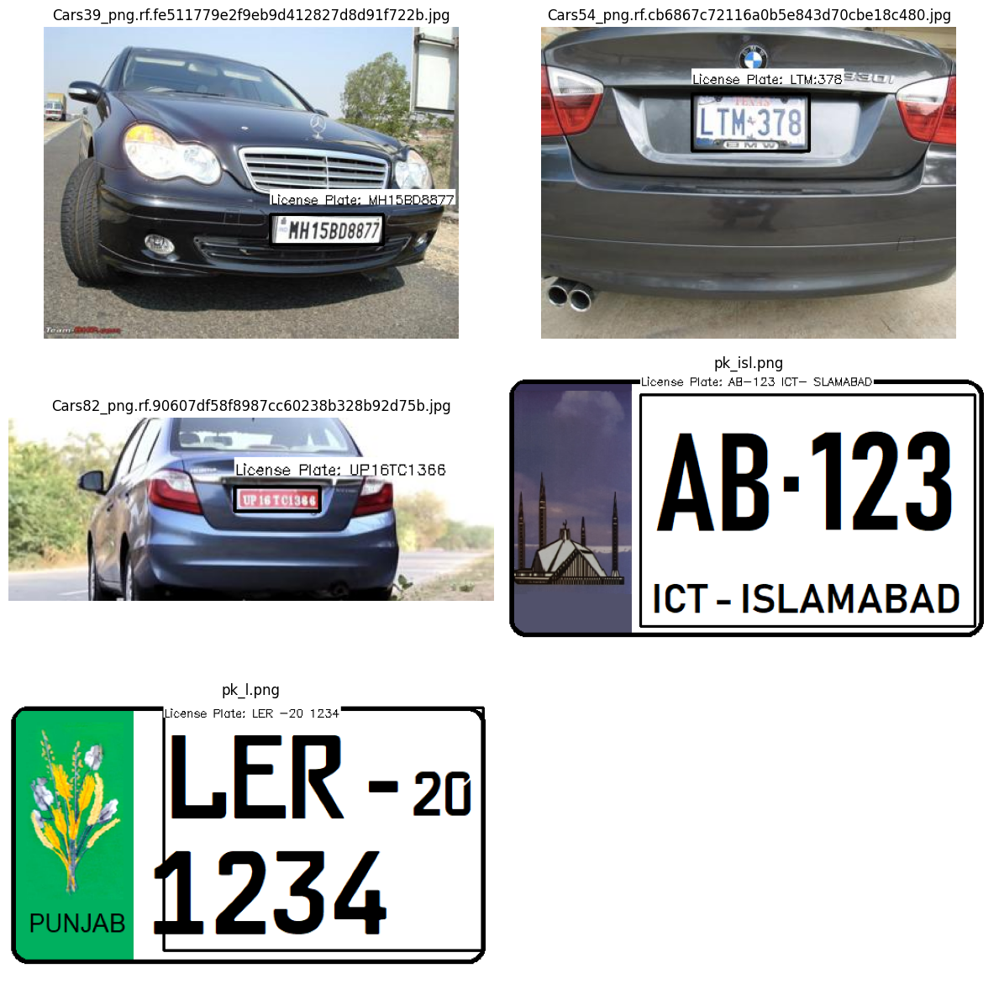

In [ ]:
# Initialize PaddleOCR
ocr = PaddleOCR(use_angle_cls=True, lang='en')  # Specify the language you want to use

# Set the folder path containing the images
folder_path = 'X:/ML1/WEEK5/day2/'

# Create a list to store the extracted license plate texts
extracted_texts = []

# Get the list of image files in the folder
image_files = [filename for filename in os.listdir(folder_path) if filename.endswith(('.jpg', '.png', '.jpeg', '.webp'))]
num_images = len(image_files)

# Create a figure with subplots
num_rows = (num_images + 1) // 2  # Calculate number of rows needed
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(12, 12))

# Iterate over the images in the folder
for i, filename in enumerate(image_files):
    # Load the image
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

    # Make predictions using the YOLOv8 model
    results = model.predict(source=image_path)

    # Initialize a list to hold the detected text lines
    text_lines = []

    # Process each detection
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates

            # Crop the license plate from the image
            license_plate = image_rgb[int(y1):int(y2), int(x1):int(x2)]

            # Apply OCR to the license plate image using PaddleOCR
            ocr_results = ocr.ocr(license_plate, cls=True)

            # Extract the text and confidence from the OCR results
            if ocr_results:
                for line in ocr_results[0]:  # Each line contains (box, (text, confidence))
                    _, (text, confidence) = line
                    text_lines.append(text)  # Append the detected text line

    # Join all detected lines into a single string
    full_text = ' '.join(text_lines)

    # Store the extracted license plate text in the list
    extracted_texts.append((filename, full_text))

    # Draw the bounding box and license plate text on the image
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates
            cv2.rectangle(image_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 0), 2)
            y = int(y1) - 10 if int(y1) - 10 > 10 else int(y1) + 10

            # Add background to the text
            (text_width, text_height), _ = cv2.getTextSize(f'License Plate: {full_text}',
                                                           cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
            cv2.rectangle(image_rgb, (int(x1), y - text_height - 5), (int(x1 + text_width), y),
                          (255, 255, 255), -1)

            # Draw the text with the background
            cv2.putText(image_rgb, f'License Plate: {full_text}',
                        (int(x1), y), cv2.FONT_HERSHEY_SIMPLEX,
                        0.4, (0, 0, 0), 1)

    # Display the image with OCR results in the subplot
    row = i // 2
    col = i % 2
    axes[row, col].imshow(image_rgb)
    axes[row, col].axis('off')
    axes[row, col].set_title(filename)

# Hide any unused subplots
for j in range(i + 1, num_rows * 2):
    axes[j // 2, j % 2].axis('off')

# Save the figure
plt.tight_layout()
plt.savefig('license_plate_detection_paddle.png')

# Create a DataFrame to store the extracted license plate texts
resultspaddle_df = pd.DataFrame(extracted_texts, columns=['Filename', 'License Plate'])

### Save Extracted Text in DataFrame

In [ ]:
resultspaddle_df

,Filename,License Plate
0,Cars39_png.rf.fe511779e2f9eb9d412827d8d91f722b...,MH15BD8877
1,Cars54_png.rf.cb6867c72116a0b5e843d70cbe18c480...,LTM:378
2,Cars82_png.rf.90607df58f8987cc60238b328b92d75b...,UP16TC1366
3,pk_isl.png,AB-123 ICT- SLAMABAD
4,pk_l.png,LER -20 1234


## **Testing on given test images**

[2024/07/31 12:54:20] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\PMLS/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\PMLS/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6,


image 1/1 X:\ML1\WEEK5\day2\testing\DSC_0968.JPG: 576x640 1 licence, 81.9ms
Speed: 2.0ms preprocess, 81.9ms inference, 0.0ms postprocess per image at shape (1, 3, 576, 640)
[2024/07/31 12:54:24] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.12441492080688477
[2024/07/31 12:54:24] ppocr DEBUG: cls num  : 2, elapsed : 0.016997098922729492
[2024/07/31 12:54:24] ppocr DEBUG: rec_res num  : 2, elapsed : 0.12427783012390137

image 1/1 X:\ML1\WEEK5\day2\testing\DSC_0969.JPG: 544x640 1 licence, 73.0ms
Speed: 5.4ms preprocess, 73.0ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)
[2024/07/31 12:54:25] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.011998414993286133
[2024/07/31 12:54:25] ppocr DEBUG: cls num  : 2, elapsed : 0.010998964309692383
[2024/07/31 12:54:25] ppocr DEBUG: rec_res num  : 2, elapsed : 0.10580277442932129

image 1/1 X:\ML1\WEEK5\day2\testing\DSC_0970.JPG: 576x640 1 licence, 92.4ms
Speed: 4.0ms preprocess, 92.4ms inference, 1.0ms postprocess per image at shape (1

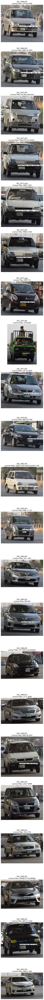

In [ ]:
# Initialize PaddleOCR
ocr = PaddleOCR(use_angle_cls=True, lang='en')  # Specify the language you want to use

# Set the folder path containing the images
folder_path = 'X:/ML1/WEEK5/day2/testing/'

# Create a list to store the extracted license plate texts
extracted_texts = []

# Get the list of image files in the folder
image_files = [filename for filename in os.listdir(folder_path) if filename.endswith(('.jpg', '.png', '.jpeg', '.webp', '.JPG'))]
num_images = len(image_files)

# Create a figure with subplots
num_cols = 1  # Only one column
num_rows = num_images  # Number of rows equal to the number of images
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(5, 5 * num_rows))

# Iterate over the images in the folder
for i, filename in enumerate(image_files):
    # Load the image
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

    # Make predictions using the YOLOv8 model
    results = model.predict(source=image_path)

    # Initialize a list to hold the detected text lines
    text_lines = []

    # Process each detection
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates

            # Crop the license plate from the image
            license_plate = image_rgb[int(y1):int(y2), int(x1):int(x2)]

            # Apply OCR to the license plate image using PaddleOCR
            ocr_results = ocr.ocr(license_plate, cls=True)

            # Extract the text and confidence from the OCR results
            detected_text = ""
            if ocr_results and ocr_results[0]:  # Check if ocr_results is not None and not empty
                for line in ocr_results[0]:  # Each line contains (box, (text, confidence))
                    _, (text, confidence) = line
                    detected_text += text + " "  # Append the detected text line

            # Strip any trailing spaces
            detected_text = detected_text.strip()

            # Add text only if detected
            if detected_text:
                text_lines.append(detected_text)

                # Draw the bounding box and license plate text on the image
                cv2.rectangle(image_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 0), 3)
                y = int(y1) - 10 if int(y1) - 10 > 10 else int(y1) + 10

                # Add background to the text
                (text_width, text_height), _ = cv2.getTextSize(f'License Plate: {detected_text}',
                                                               cv2.FONT_HERSHEY_SIMPLEX, 1, 2)
                cv2.rectangle(image_rgb, (int(x1), y - text_height - 5), (int(x1 + text_width), y),
                              (255, 255, 255), -1)

                # Draw the text with the background
                cv2.putText(image_rgb, f'License Plate: {detected_text}',
                            (int(x1), y), cv2.FONT_HERSHEY_SIMPLEX,
                            1, (0, 0, 0), 2)

    # Join all detected lines into a single string for the title
    full_text = ' '.join(text_lines) if text_lines else "No text detected"

    # Store the extracted license plate text in the list
    extracted_texts.append((filename, full_text))

    # Display the image with OCR results in the subplot
    axes[i].imshow(image_rgb)
    axes[i].axis('off')
    axes[i].set_title(f"{filename}\nLicense Plate: {full_text}")

# Hide any unused subplots (though in this case, all should be used)
for j in range(i + 1, num_rows):
    axes[j].axis('off')

# Save the figure
plt.tight_layout()
plt.savefig('license_plate_detection_paddle.png')

# Create a DataFrame to store the extracted license plate texts
resultspaddletest_df = pd.DataFrame(extracted_texts, columns=['Filename', 'License Plate'])

### Save Extracted Text in DataFrame

In [ ]:
resultspaddletest_df

,Filename,License Plate
0,DSC_0968.JPG,LEA-06 1856
1,DSC_0969.JPG,MNA-08 3685
2,DSC_0970.JPG,No text detected
3,DSC_0971.JPG,PKAIS-PCUCE VR287 .
4,DSC_0971x.jpg,MNA- 2206
5,DSC_0973.JPG,MND15 464
6,DSC_0973x.jpg,BFM-731
7,DSC_0975.JPG,LETs5280
8,DSC_0977.JPG,LEF-16 2640
9,DSC_0979.JPG,BRA-09 1408


# **Further Training using best weights from previous training**

### Save the Model

In [ ]:
# Load a model
model = YOLO('/content/gdrive/MyDrive/License_Plate_Detection/runs_backup/detect/train2/weights/best.pt')

# Use the model
results = model.train(data=os.path.join(ROOT_DIR, "data.yaml"), epochs=150, imgsz=640)

### Saving runs folder to Drive

In [11]:
source_path = '/content/runs/'
destination_path = '/content/gdrive/MyDrive/License_Plate_Detection/runs2_backup'
shutil.copytree(source_path, destination_path)

'/content/gdrive/MyDrive/License_Plate_Detection/runs2_backup'

### New Statistics

<img src="stats2.jpg" alt="Description"/>

### Test Model

In [3]:
model = YOLO("best2.pt")

[2024/07/31 21:58:51] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\PMLS/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\PMLS/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6,

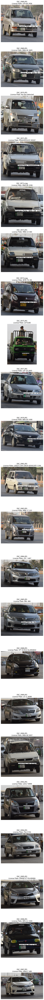

In [4]:
# Initialize PaddleOCR
ocr = PaddleOCR(use_angle_cls=True, lang='en')  # Specify the language you want to use

# Set the folder path containing the images
folder_path = 'X:/ML1/WEEK5/day2/testing/'

# Create a list to store the extracted license plate texts
extracted_texts = []

# Get the list of image files in the folder
image_files = [filename for filename in os.listdir(folder_path) if filename.endswith(('.jpg', '.png', '.jpeg', '.webp', '.JPG'))]
num_images = len(image_files)

# Create a figure with subplots
num_cols = 1  # Only one column
num_rows = num_images  # Number of rows equal to the number of images
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(5, 5 * num_rows))

# Iterate over the images in the folder
for i, filename in enumerate(image_files):
    # Load the image
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

    # Make predictions using the YOLOv8 model
    results = model.predict(source=image_path)

    # Initialize a list to hold the detected text lines
    text_lines = []

    # Process each detection
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates

            # Crop the license plate from the image
            license_plate = image_rgb[int(y1):int(y2), int(x1):int(x2)]

            # Apply OCR to the license plate image using PaddleOCR
            ocr_results = ocr.ocr(license_plate, cls=True)

            # Extract the text and confidence from the OCR results
            detected_text = ""
            if ocr_results and ocr_results[0]:  # Check if ocr_results is not None and not empty
                for line in ocr_results[0]:  # Each line contains (box, (text, confidence))
                    _, (text, confidence) = line
                    detected_text += text + " "  # Append the detected text line

            # Strip any trailing spaces
            detected_text = detected_text.strip()

            # Add text only if detected
            if detected_text:
                text_lines.append(detected_text)

                # Draw the bounding box and license plate text on the image
                cv2.rectangle(image_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 0), 3)
                y = int(y1) - 10 if int(y1) - 10 > 10 else int(y1) + 10

                # Add background to the text
                (text_width, text_height), _ = cv2.getTextSize(f'License Plate: {detected_text}',
                                                               cv2.FONT_HERSHEY_SIMPLEX, 1, 2)
                cv2.rectangle(image_rgb, (int(x1), y - text_height - 5), (int(x1 + text_width), y),
                              (255, 255, 255), -1)

                # Draw the text with the background
                cv2.putText(image_rgb, f'License Plate: {detected_text}',
                            (int(x1), y), cv2.FONT_HERSHEY_SIMPLEX,
                            1, (0, 0, 0), 2)

    # Join all detected lines into a single string for the title
    full_text = ' '.join(text_lines) if text_lines else "No text detected"

    # Store the extracted license plate text in the list
    extracted_texts.append((filename, full_text))

    # Display the image with OCR results in the subplot
    axes[i].imshow(image_rgb)
    axes[i].axis('off')
    axes[i].set_title(f"{filename}\nLicense Plate: {full_text}")

# Hide any unused subplots (though in this case, all should be used)
for j in range(i + 1, num_rows):
    axes[j].axis('off')

# Save the figure
plt.tight_layout()
plt.savefig('license_plate_detection_paddle.png')

# Create a DataFrame to store the extracted license plate texts
resultspaddletest_df = pd.DataFrame(extracted_texts, columns=['Filename', 'License Plate'])

In [5]:
resultspaddletest_df

,Filename,License Plate
0,DSC_0968.JPG,LEA-06 1856
1,DSC_0969.JPG,MNA-08 3685
2,DSC_0970.JPG,No text detected
3,DSC_0971.JPG,PEKAHSPOUCE VR287
4,DSC_0971x.jpg,MNA-08 2206
5,DSC_0973.JPG,MND-15 464
6,DSC_0973x.jpg,BFM-731 NS
7,DSC_0975.JPG,LET5280
8,DSC_0977.JPG,LEF-16 2640
9,DSC_0979.JPG,BRA-09 1408


# **Conclusion**

### In this task, we have successfully extracted license plate texts from images using YOLOv8 and PaddleOCR.The results are pretty good and can be used for further training. Model can be made better by using an extensive dataset. Different OCRs can be used which are faster and better in performance than Paddle OCR, e.g. Google OCR.